In [63]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.tools.plotting import scatter_matrix


import sys 
sys.path.append('../')
import src.features.feature_cleaning as feature_cleaning

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

#sklearn
from sklearn import tree
import graphviz 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from mlxtend.plotting import plot_confusion_matrix
from sklearn import 

In [4]:
df, fieldofdegree_df, SOCP_labels, schl_labels = feature_cleaning.load_dfs()

In [5]:
youngemp_df = feature_cleaning.clean_that_target(df, SOCP_labels)

../src/features/feature_cleaning.py:73: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  SOCPdf = df.dropna(axis='index', subset=['SOCP'])[df.SOCP != '999920']


Number of employed people: 218454
Percent employed people: 0.5785711448056677
Number of young employed people: 77406
Percent young employed people(out of all PUMS): 0.20500827650135733
Number of emp cats: 23


In [6]:
edu_df = feature_cleaning.create_edu_df(youngemp_df, fieldofdegree_df, schl_labels)

Number of degree fields present (max 173): 173


/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:4405: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value
../src/features/feature_cleaning.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  edu_df['SCHL_labels'] = edu_df.SCHL.map(schl_labels)
../src/features/feature_cleaning.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/i

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77406 entries, 0 to 77405
Data columns (total 11 columns):
SERIALNO           77406 non-null int64
SOCP               77406 non-null object
MAJ_SOCP           77406 non-null object
MAJ_SOCP_labels    77406 non-null object
FOD1P              77406 non-null object
FOD2P              77406 non-null object
FOD1P_labels       77406 non-null object
FOD2P_labels       77406 non-null object
SCHL               77406 non-null object
SCHL_labels        77406 non-null object
SCHL_ord           77406 non-null int64
dtypes: int64(2), object(9)
memory usage: 46.5 MB
None


In [7]:
edu_df.head()

,SERIALNO,SOCP,MAJ_SOCP,MAJ_SOCP_labels,FOD1P,FOD2P,SCHL,SCHL_ord,"SCHL__1 or more years of college credit, no degree",SCHL__12th grade - no diploma,SCHL__Associate's degree,SCHL__Bachelor's degree,SCHL__Doctorate degree,SCHL__GED or alternative credential,SCHL__Grade 1,SCHL__Grade 10,SCHL__Grade 11,SCHL__Grade 2,SCHL__Grade 3,SCHL__Grade 4,SCHL__Grade 5,SCHL__Grade 6,SCHL__Grade 7,SCHL__Grade 8,SCHL__Grade 9,SCHL__Kindergarten,SCHL__Master's degree,SCHL__No schooling completed,"SCHL__Nursery school, preschool",SCHL__Professional degree beyond a bachelor's degree,SCHL__Regular high school diploma,"SCHL__Some college, but less than 1 year",FOD1P__Accounting,FOD1P__Actuarial Science,FOD1P__Advertising And Public Relations,FOD1P__Aerospace Engineering,FOD1P__Agricultural Economics,FOD1P__Agriculture Production And Management,FOD1P__Animal Sciences,FOD1P__Anthropology And Archeology,FOD1P__Applied Mathematics,FOD1P__Architectural Engineering,FOD1P__Architecture,FOD1P__Area Ethnic And Civilization Studies,FOD1P__Art And Music Education,FOD1P__Art History And Criticism,FOD1P__Astronomy And Astrophysics,FOD1P__Atmospheric Sciences And Meteorology,FOD1P__Biochemical Sciences,FOD1P__Biological Engineering,FOD1P__Biology,FOD1P__Biomedical Engineering,FOD1P__Botany,FOD1P__Business Economics,FOD1P__Business Management And Administration,FOD1P__Chemical Engineering,FOD1P__Chemistry,FOD1P__Civil Engineering,FOD1P__Clinical Psychology,FOD1P__Cognitive Science And Biopsychology,FOD1P__Commercial Art And Graphic Design,FOD1P__Communication Disorders Sciences And Services,FOD1P__Communication Technologies,FOD1P__Communications,FOD1P__Community And Public Health,FOD1P__Composition And Rhetoric,FOD1P__Computer Administration Management And Security,FOD1P__Computer And Information Systems,FOD1P__Computer Engineering,FOD1P__Computer Networking And Telecommunications,FOD1P__Computer Programming And Data Processing,FOD1P__Computer Science,FOD1P__Construction Services,FOD1P__Cosmetology Services And Culinary Arts,FOD1P__Counseling Psychology,FOD1P__Court Reporting,FOD1P__Criminal Justice And Fire Protection,FOD1P__Criminology,FOD1P__Drama And Theater Arts,FOD1P__Early Childhood Education,FOD1P__Ecology,FOD1P__Economics,FOD1P__Educational Administration And Supervision,FOD1P__Educational Psychology,FOD1P__Electrical Engineering,FOD1P__Electrical Engineering Technology,"FOD1P__Electrical, Mechanical, And Precision Technologies And Production",FOD1P__Elementary Education,FOD1P__Engineering And Industrial Management,FOD1P__Engineering Mechanics Physics And Science,FOD1P__Engineering Technologies,FOD1P__English Language And Literature,FOD1P__Environmental Engineering,FOD1P__Environmental Science,FOD1P__Family And Consumer Sciences,FOD1P__Film Video And Photographic Arts,FOD1P__Finance,FOD1P__Fine Arts,FOD1P__Food Science,FOD1P__Forestry,FOD1P__French German Latin And Other Common Foreign Language Studies,FOD1P__General Agriculture,FOD1P__General Business,FOD1P__General Education,FOD1P__General Engineering,FOD1P__General Medical And Health Services,FOD1P__General Social Sciences,FOD1P__Genetics,FOD1P__Geography,FOD1P__Geological And Geophysical Engineering,FOD1P__Geology And Earth Science,FOD1P__Geosciences,FOD1P__Health And Medical Administrative Services,FOD1P__Health And Medical Preparatory Programs,FOD1P__History,FOD1P__Hospitality Management,FOD1P__Human Resources And Personnel Management,FOD1P__Human Services And Community Organization,FOD1P__Humanities,FOD1P__Industrial And Manufacturing Engineering,FOD1P__Industrial And Organizational Psychology,FOD1P__Industrial Production Technologies,FOD1P__Information Sciences,FOD1P__Intercultural And International Studies,FOD1P__Interdisciplinary Social Sciences,FOD1P__International Business,FOD1P__International Relations,FOD1P__Journalism,FOD1P__Language And Drama Education,FOD1P__Liberal Arts,FOD1P__Library Science,FOD1P__Linguistics And Comparative Language And Literature,FOD1P__Management Information System

In [8]:
X = edu_df.drop(axis=1, columns=['SERIALNO', 'SOCP', 'MAJ_SOCP', 'MAJ_SOCP_labels', 'FOD1P', 'FOD2P', 'SCHL'])
X

,SCHL_ord,"SCHL__1 or more years of college credit, no degree",SCHL__12th grade - no diploma,SCHL__Associate's degree,SCHL__Bachelor's degree,SCHL__Doctorate degree,SCHL__GED or alternative credential,SCHL__Grade 1,SCHL__Grade 10,SCHL__Grade 11,SCHL__Grade 2,SCHL__Grade 3,SCHL__Grade 4,SCHL__Grade 5,SCHL__Grade 6,SCHL__Grade 7,SCHL__Grade 8,SCHL__Grade 9,SCHL__Kindergarten,SCHL__Master's degree,SCHL__No schooling completed,"SCHL__Nursery school, preschool",SCHL__Professional degree beyond a bachelor's degree,SCHL__Regular high school diploma,"SCHL__Some college, but less than 1 year",FOD1P__Accounting,FOD1P__Actuarial Science,FOD1P__Advertising And Public Relations,FOD1P__Aerospace Engineering,FOD1P__Agricultural Economics,FOD1P__Agriculture Production And Management,FOD1P__Animal Sciences,FOD1P__Anthropology And Archeology,FOD1P__Applied Mathematics,FOD1P__Architectural Engineering,FOD1P__Architecture,FOD1P__Area Ethnic And Civilization Studies,FOD1P__Art And Music Education,FOD1P__Art History And Criticism,FOD1P__Astronomy And Astrophysics,FOD1P__Atmospheric Sciences And Meteorology,FOD1P__Biochemical Sciences,FOD1P__Biological Engineering,FOD1P__Biology,FOD1P__Biomedical Engineering,FOD1P__Botany,FOD1P__Business Economics,FOD1P__Business Management And Administration,FOD1P__Chemical Engineering,FOD1P__Chemistry,FOD1P__Civil Engineering,FOD1P__Clinical Psychology,FOD1P__Cognitive Science And Biopsychology,FOD1P__Commercial Art And Graphic Design,FOD1P__Communication Disorders Sciences And Services,FOD1P__Communication Technologies,FOD1P__Communications,FOD1P__Community And Public Health,FOD1P__Composition And Rhetoric,FOD1P__Computer Administration Management And Security,FOD1P__Computer And Information Systems,FOD1P__Computer Engineering,FOD1P__Computer Networking And Telecommunications,FOD1P__Computer Programming And Data Processing,FOD1P__Computer Science,FOD1P__Construction Services,FOD1P__Cosmetology Services And Culinary Arts,FOD1P__Counseling Psychology,FOD1P__Court Reporting,FOD1P__Criminal Justice And Fire Protection,FOD1P__Criminology,FOD1P__Drama And Theater Arts,FOD1P__Early Childhood Education,FOD1P__Ecology,FOD1P__Economics,FOD1P__Educational Administration And Supervision,FOD1P__Educational Psychology,FOD1P__Electrical Engineering,FOD1P__Electrical Engineering Technology,"FOD1P__Electrical, Mechanical, And Precision Technologies And Production",FOD1P__Elementary Education,FOD1P__Engineering And Industrial Management,FOD1P__Engineering Mechanics Physics And Science,FOD1P__Engineering Technologies,FOD1P__English Language And Literature,FOD1P__Environmental Engineering,FOD1P__Environmental Science,FOD1P__Family And Consumer Sciences,FOD1P__Film Video And Photographic Arts,FOD1P__Finance,FOD1P__Fine Arts,FOD1P__Food Science,FOD1P__Forestry,FOD1P__French German Latin And Other Common Foreign Language Studies,FOD1P__General Agriculture,FOD1P__General Business,FOD1P__General Education,FOD1P__General Engineering,FOD1P__General Medical And Health Services,FOD1P__General Social Sciences,FOD1P__Genetics,FOD1P__Geography,FOD1P__Geological And Geophysical Engineering,FOD1P__Geology And Earth Science,FOD1P__Geosciences,FOD1P__Health And Medical Administrative Services,FOD1P__Health And Medical Preparatory Programs,FOD1P__History,FOD1P__Hospitality Management,FOD1P__Human Resources And Personnel Management,FOD1P__Human Services And Community Organization,FOD1P__Humanities,FOD1P__Industrial And Manufacturing Engineering,FOD1P__Industrial And Organizational Psychology,FOD1P__Industrial Production Technologies,FOD1P__Information Sciences,FOD1P__Intercultural And International Studies,FOD1P__Interdisciplinary Social Sciences,FOD1P__International Business,FOD1P__International Relations,FOD1P__Journalism,FOD1P__Language And Drama Education,FOD1P__Liberal Arts,FOD1P__Library Science,FOD1P__Linguistics And Comparative Language And Literature,FOD1P__Management Information Systems And Statistics,FOD1P__Marketing And Marketing Research

In [9]:
y = edu_df.MAJ_SOCP_labels
y

0                          Architecture and Engineering
1                     Business and Financial Operations
2                     Business and Financial Operations
3                             Personal Care and Service
4                     Office and Administrative Support
5                Healthcare Practitioners and Technical
6                                            Management
7                  Food Preparation and Serving Related
8                     Office and Administrative Support
9                                     Sales and Related
10                   Transportation and Material Moving
11                                    Sales and Related
12                                           Management
13                   Transportation and Material Moving
14               Healthcare Practitioners and Technical
15               Healthcare Practitioners and Technical
16                   Transportation and Material Moving
17                                   Healthcare 

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=22)

In [60]:
clf = tree.DecisionTreeClassifier()
clf.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [17]:
y.unique()

array(['Architecture and Engineering',
       'Business and Financial Operations', 'Personal Care and Service',
       'Office and Administrative Support',
       'Healthcare Practitioners and Technical', 'Management',
       'Food Preparation and Serving Related', 'Sales and Related',
       'Transportation and Material Moving', 'Healthcare Support',
       'Building and Grounds Cleaning and Maintenance',
       'Protective Service', 'Production', 'Legal',
       'Construction and Extraction', 'Community and Social Service',
       'Computer and Mathematical', 'Military Specific',
       'Installation, Maintenance, and Repair',
       'Farming, Fishing, and Forestry',
       'Education, Training, and Library',
       'Life, Physical, and Social Science',
       'Arts, Design, Entertainment, Sports, and Media'], dtype=object)

In [66]:
y_labels = ['Architecture and Engineering',
       'Business and Financial Operations', 'Personal Care and Service',
       'Office and Administrative Support',
       'Healthcare Practitioners and Technical', 'Management',
       'Food Preparation and Serving Related', 'Sales and Related',
       'Transportation and Material Moving', 'Healthcare Support',
       'Building and Grounds Cleaning and Maintenance',
       'Protective Service', 'Production', 'Legal',
       'Construction and Extraction', 'Community and Social Service',
       'Computer and Mathematical', 'Military Specific',
       'Installation, Maintenance, and Repair',
       'Farming, Fishing, and Forestry',
       'Education, Training, and Library',
       'Life, Physical, and Social Science',
       'Arts, Design, Entertainment, Sports, and Media']

In [96]:
dot_data = tree.export_graphviz(clf, out_file=None, feature_names=X.columns, class_names=y_labels)
graph = graphviz.Source(dot_data) 
graph
                                
                                 
#                          class_names=y_labels,  
#                          filled=True, rounded=True,  
#                          special_characters=True)


ValueError: Length of feature_names, 350 does not match number of features, 1

In [61]:
y_pred = clf.predict(X_test)  

In [62]:
conf_matr = confusion_matrix(y_test, y_pred) 
print(classification_report(y_test, y_pred))  

                                                precision    recall  f1-score   support

                  Architecture and Engineering       0.31      0.42      0.36       415
Arts, Design, Entertainment, Sports, and Media       0.32      0.26      0.29       857
 Building and Grounds Cleaning and Maintenance       0.00      0.00      0.00       690
             Business and Financial Operations       0.28      0.20      0.23       994
                  Community and Social Service       0.23      0.18      0.21       368
                     Computer and Mathematical       0.48      0.38      0.42       840
                   Construction and Extraction       0.12      0.03      0.04       904
              Education, Training, and Library       0.32      0.25      0.28      1327
                Farming, Fishing, and Forestry       0.22      0.21      0.22       316
          Food Preparation and Serving Related       0.18      0.11      0.14      2159
        Healthcare Practitioner

In [67]:
f1_score(y_test, y_pred, average='micro', labels=y_labels)

0.21169580570148996

In [33]:
clf.feature_importances_.argmax()

158

In [36]:
clf.feature_importances_

array([8.12914703e-02, 0.00000000e+00, 0.00000000e+00, 4.52850521e-03,
       8.77384889e-04, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 5.78739541e-04, 0.00000000e+00, 2.15408432e-04,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       2.28198235e-04, 2.00095900e-03, 0.00000000e+00, 1.50433307e-02,
       3.83095768e-04, 0.00000000e+00, 1.02441813e-02, 0.00000000e+00,
       0.00000000e+00, 2.00354349e-02, 3.93548432e-04, 1.53877880e-03,
       3.29025163e-03, 8.34725515e-05, 1.25910643e-03, 1.43891372e-03,
       1.58166187e-03, 1.25448951e-03, 7.72681323e-04, 5.32850953e-03,
       1.31273052e-03, 1.43605037e-03, 1.06911091e-03, 7.17423229e-04,
       5.53051202e-04, 2.19034852e-03, 9.11558051e-04, 1.14903193e-02,
       1.46313030e-03, 8.86886287e-04, 2.39918519e-03, 5.95116552e-03,
       2.36188928e-03, 2.40020861e-03, 6.47908366e-03, 5.52481508e-04,
       1.12088727e-03, 8.81195047e-03, 4.60118407e-03, 3.26491136e-03,
      

In [37]:
X.columns[158]

'FOD1P__No major'

In [43]:
pd.DataFrame(conf_matr, index=y.unique()) #, columns=y.unique()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22
Architecture and Engineering,175,9,0,15,2,93,0,17,0,5,7,0,0,2,9,33,0,97,0,0,1,1,0
Business and Financial Operations,34,203,0,24,7,17,1,48,2,42,7,0,0,3,5,45,0,377,1,0,3,11,2
Personal Care and Service,2,3,0,2,2,2,2,2,40,141,1,0,0,0,1,5,0,445,0,0,2,0,10
Office and Administrative Support,26,35,0,236,14,39,0,59,0,21,14,1,0,5,19,158,0,384,1,0,6,30,2
Healthcare Practitioners and Technical,5,6,0,14,73,4,0,38,2,2,13,1,0,3,4,16,0,156,0,0,10,2,0
Management,52,28,0,46,4,339,0,40,0,5,15,0,0,0,9,58,0,230,1,0,6,11,2
Food Preparation and Serving Related,4,7,1,1,0,3,8,3,44,177,1,0,0,1,1,7,0,638,0,0,2,0,23
Sales and Related,25,45,0,28,25,30,0,340,0,35,45,1,0,15,24,72,0,571,1,1,4,12,3
Transportation and Material Moving,2,0,0,1,0,1,11,0,65,79,1,0,0,0,3,4,0,146,0,0,0,0,12
Healthcare Support,7,28,0,16,6,8,4,27,30,265,13,1,0,3,4,37,0,1663,0,0,1,11,19


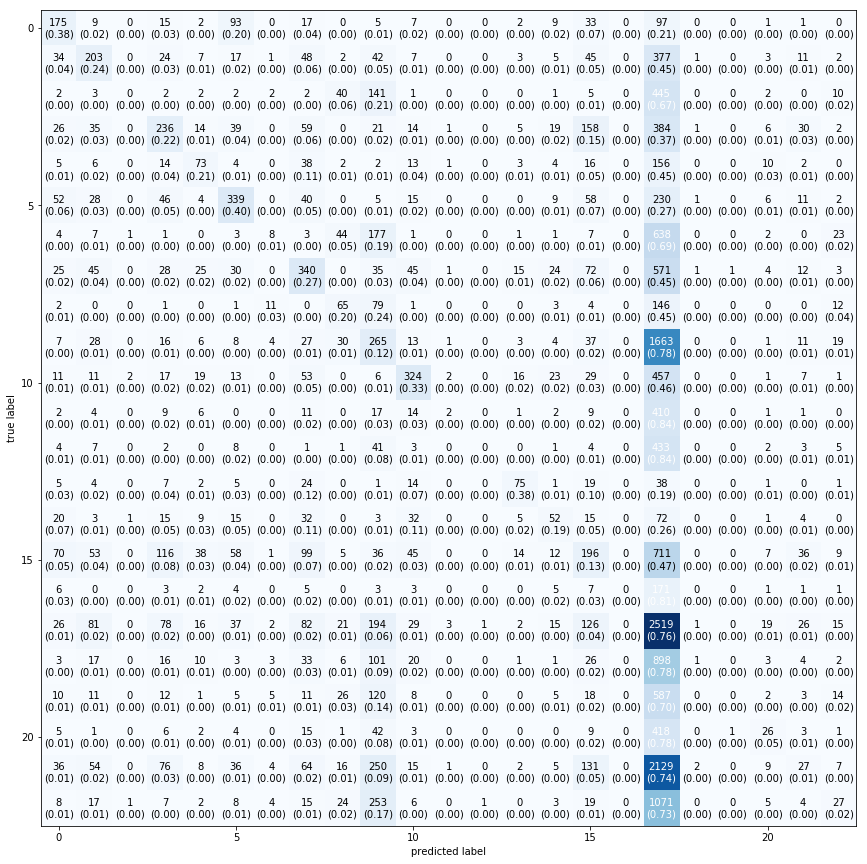

In [54]:
fig, ax = plot_confusion_matrix(conf_mat=conf_matr, figsize=(15,15), show_normed=True)


 ## random baseline

In [72]:
edu_df['rand'] = np.random.rand(77406,1)
edu_df['rand']

0        0.918326
1        0.560863
2        0.104476
3        0.771529
4        0.199043
5        0.533415
6        0.644471
7        0.549360
8        0.511160
9        0.933927
10       0.392538
11       0.951585
12       0.600382
13       0.108040
14       0.334279
15       0.341549
16       0.276032
17       0.287009
18       0.986889
19       0.601526
20       0.393805
21       0.546175
22       0.163579
23       0.190395
24       0.277758
25       0.889198
26       0.924616
27       0.704988
28       0.317595
29       0.967471
30       0.613620
31       0.178933
32       0.967694
33       0.372606
34       0.523878
35       0.122611
36       0.922788
37       0.032286
38       0.627550
39       0.155972
40       0.775019
41       0.039193
42       0.652794
43       0.825555
44       0.201322
45       0.790472
46       0.465102
47       0.968256
48       0.449902
49       0.943931
50       0.562015
51       0.450074
52       0.666272
53       0.722174
54       0.720031
55       0

In [73]:
X_baseline = edu_df.rand

In [88]:
X_baseline = np.array(X_baseline)
X_baseline = X_baseline.reshape(-1,1)
X_baseline.shape

(77406, 1)

In [91]:
y.shape

(77406,)

In [89]:
X_train, X_test, y_train, y_test = train_test_split(X_baseline, y, test_size=0.30, random_state=22)

In [92]:
clf = tree.DecisionTreeClassifier()
clf.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [93]:
y_pred = clf.predict(X_test)

In [94]:
conf_matr = confusion_matrix(y_test, y_pred) 
print(classification_report(y_test, y_pred))  

                                                precision    recall  f1-score   support

                  Architecture and Engineering       0.02      0.02      0.02       415
Arts, Design, Entertainment, Sports, and Media       0.04      0.04      0.04       857
 Building and Grounds Cleaning and Maintenance       0.03      0.03      0.03       690
             Business and Financial Operations       0.04      0.04      0.04       994
                  Community and Social Service       0.01      0.01      0.01       368
                     Computer and Mathematical       0.03      0.04      0.03       840
                   Construction and Extraction       0.03      0.03      0.03       904
              Education, Training, and Library       0.06      0.06      0.06      1327
                Farming, Fishing, and Forestry       0.02      0.02      0.02       316
          Food Preparation and Serving Related       0.09      0.09      0.09      2159
        Healthcare Practitioner

In [95]:
f1_score(y_test, y_pred, average='micro', labels=y_labels)

0.06838342950650246